# Flower Detector

Project Goal: Develop a supervised object detection model using YOLO to accurately identify and localise various types of flowers in images.

# Data Preprocessing and Exploratory Data Analysis

Data Source: https://universe.roboflow.com/plants-yda3t/plantidentification-eon4y

In [ ]:
# Download Roboflow dataset
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="UhmjBgTZjfY8QSCIlwDm")
project = rf.workspace("plants-yda3t").project("plantidentification-eon4y")
version = project.version(3)
dataset = version.download("yolov5")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 118.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 125.4 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to plantIdentification-3 in yolov5pytorch:: 100%|██████████| 4828/4828 [00:00<00:00, 6653.07it/s]


In [ ]:
# Clone YOLOv5 repo
!git clone https://github.com/ultralytics/yolov5

# Install dependencies
%cd yolov5
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17511, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 17511 (delta 5), reused 0 (delta 0), pack-reused 17491 (from 3)
Receiving objects: 100% (17511/17511), 16.65 MiB | 17.24 MiB/s, done.
Resolving deltas: 100% (11996/11996), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.5 MB/s eta

In [ ]:
# Import libraries
import os
import shutil
import random
from collections import defaultdict

import yaml
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

import matplotlib.patches as patches
import cv2

import albumentations as A

Merge Roboflow's given train/valid/test split

In [ ]:
# Folders
base_dir = "/content/plantIdentification-3"
combined_images = f"{base_dir}/combined/images"
combined_labels = f"{base_dir}/combined/labels"
os.makedirs(combined_images, exist_ok=True)
os.makedirs(combined_labels, exist_ok=True)

# Merge all existing train/valid/test into one
for split in ["train", "valid", "test"]:
    for f in os.listdir(f"{base_dir}/{split}/images"):
        shutil.copy(f"{base_dir}/{split}/images/{f}", combined_images)
    for f in os.listdir(f"{base_dir}/{split}/labels"):
        shutil.copy(f"{base_dir}/{split}/labels/{f}", combined_labels)

**Direct Resplit:**

* Group all the images in the dataset by class and resplit them into train/valid/test sets using a 80/10/10 ratio

In [ ]:
random.seed(42)

# Group images by class
grouped = defaultdict(list)
label_dir = combined_labels
image_dir = combined_images

for label_file in sorted(os.listdir(label_dir)):
    with open(os.path.join(label_dir, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = lines[0].split()[0]
            img_file = label_file.replace(".txt", ".jpg")
            grouped[class_id].append(img_file)

# Create split folders
for split in ["train", "valid", "test"]:
    os.makedirs(f"{base_dir}/resplit/{split}/images", exist_ok=True)
    os.makedirs(f"{base_dir}/resplit/{split}/labels", exist_ok=True)

# Split each class group into train/valid/test
for class_id, files in grouped.items():
    random.shuffle(files)
    n = len(files)
    n_train = int(0.8 * n)
    n_val = int(0.1 * n)

    split_data = {
        "train": files[:n_train],
        "valid": files[n_train:n_train+n_val],
        "test": files[n_train+n_val:]
    }

    for split, file_list in split_data.items():
        for img in file_list:
            txt = img.replace(".jpg", ".txt")
            shutil.copy(os.path.join(image_dir, img), os.path.join(base_dir, f"resplit/{split}/images", img))
            shutil.copy(os.path.join(label_dir, txt), os.path.join(base_dir, f"resplit/{split}/labels", txt))

Class Distribution (by Instances) in Training Set [Original Set VS Direct Resplit Set]

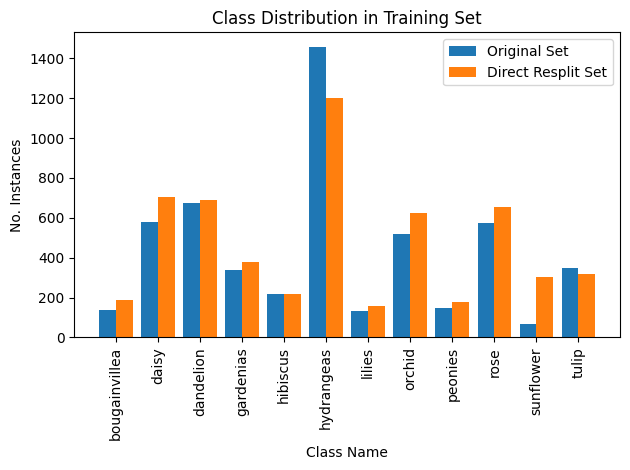

In [ ]:
# Load class names from data.yaml
with open(os.path.join(base_dir, "data.yaml")) as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

# Count class occurrences
all_labels_original = []
label_dir_original = os.path.join(base_dir, "train/labels")

for label_file in os.listdir(label_dir_original):
    with open(os.path.join(label_dir_original, label_file)) as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            all_labels_original.append(class_id)

counts_original = Counter(all_labels_original)

# Count class occurrences
all_labels_new = []
label_dir_new = os.path.join(base_dir, "resplit/train/labels")

for label_file in os.listdir(label_dir_new):
    with open(os.path.join(label_dir_new, label_file)) as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            all_labels_new.append(class_id)

counts_new = Counter(all_labels_new)

# Sort class IDs
sorted_ids = sorted(counts_original.keys())

# Get sorted class names and values
x_labels = [class_names[i] for i in sorted_ids]
y_values_original = [counts_original[i] for i in sorted_ids]
y_values_new = [counts_new[i] for i in sorted_ids]

# Plot
w, x = 0.4, np.arange(len(x_labels))
plt.bar(x - w/2, y_values_original, w, label='Original Set')
plt.bar(x + w/2, y_values_new, w, label='Direct Resplit Set')
plt.title("Class Distribution in Training Set")
plt.xlabel("Class Name")
plt.ylabel("No. Instances")
plt.xticks(x, x_labels, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

Class Distribution (by Images) in Training Set [Original Set VS Direct Resplit Set]

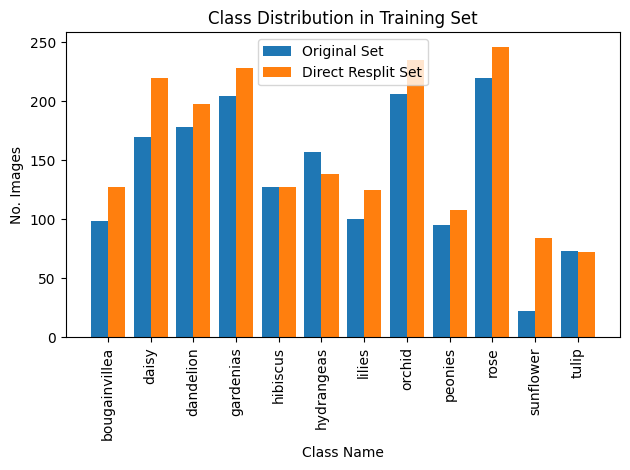

In [ ]:
# Load class names from data.yaml
with open(os.path.join(base_dir, "data.yaml")) as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

# Count class occurrences
all_labels_original = []
label_dir_original = os.path.join(base_dir, "train/labels")

for label_file in os.listdir(label_dir_original):
    with open(os.path.join(label_dir_original, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = int(lines[0].split()[0])
            all_labels_original.append(class_id)

counts_original = Counter(all_labels_original)

# Count class occurrences
all_labels_new = []
label_dir_new = os.path.join(base_dir, "resplit/train/labels")

for label_file in os.listdir(label_dir_new):
    with open(os.path.join(label_dir_new, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = int(lines[0].split()[0])
            all_labels_new.append(class_id)

counts_new = Counter(all_labels_new)

# Sort class IDs
sorted_ids = sorted(counts_original.keys())

# Get sorted class names and values
x_labels = [class_names[i] for i in sorted_ids]
y_values_original = [counts_original[i] for i in sorted_ids]
y_values_new = [counts_new[i] for i in sorted_ids]

# Plot
w, x = 0.4, np.arange(len(x_labels))
plt.bar(x - w/2, y_values_original, w, label='Original Set')
plt.bar(x + w/2, y_values_new, w, label='Direct Resplit Set')
plt.title("Class Distribution in Training Set")
plt.xlabel("Class Name")
plt.ylabel("No. Images")
plt.xticks(x, x_labels, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

**Data Augmentation + Resplit:**

* Count the number of images per class and augment underrepresented classes
* Group all the images in the dataset by class and resplit them into train/valid/test sets using a 80/10/10 ratio

In [ ]:
# Folders
base_dir = "/content/plantIdentification-3"
image_dir = f"{base_dir}/combined/images"
label_dir = f"{base_dir}/combined/labels"
output_image_dir = f"{base_dir}/augmented/images"
output_label_dir = f"{base_dir}/augmented/labels"

# Create output dirs
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_label_dir, exist_ok=True)

# Albumentations augmentation pipeline
augment = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Blur(p=0.2),
    A.RandomScale(scale_limit=0.1, p=0.3),
    A.Rotate(limit=15, p=0.3)
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

# Helper to load YOLO labels
def load_yolo_label(file_path):
    bboxes, class_ids = [], []
    with open(file_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            cls, bbox = parts[0], list(map(float, parts[1:]))
            bboxes.append(bbox)
            class_ids.append(cls)
    return bboxes, class_ids

# Step 0: Copy original dataset to output folders
print("Copying original dataset...")
for img_file in os.listdir(image_dir):
    label_file = img_file.replace('.jpg', '.txt')
    shutil.copy(os.path.join(image_dir, img_file), os.path.join(output_image_dir, img_file))
    shutil.copy(os.path.join(label_dir, label_file), os.path.join(output_label_dir, label_file))

# Step 1: Count number of images per class
class_to_images = defaultdict(set)
for label_file in os.listdir(label_dir):
    label_path = os.path.join(label_dir, label_file)
    with open(label_path, 'r') as f:
        for line in f:
            cls_id = line.split()[0]
            class_to_images[cls_id].add(label_file.replace('.txt', '.jpg'))

# Step 2: Determine max image count
class_counts = {cls: len(imgs) for cls, imgs in class_to_images.items()}
max_count = max(class_counts.values())
print("Initial class image counts:", class_counts)

# Step 3: Augment underrepresented classes
for cls, images in class_to_images.items():
    images = list(images)
    current_count = len(images)
    needed = max_count - current_count
    print(f"\nClass {cls} needs {needed} more images.")

    if needed <= 0:
        continue

    augment_counter = 0
    while augment_counter < needed:
        img_file = random.choice(images)
        label_file = img_file.replace('.jpg', '.txt')
        img_path = os.path.join(image_dir, img_file)
        label_path = os.path.join(label_dir, label_file)

        image = cv2.imread(img_path)
        if image is None:
            print(f"Could not load {img_path}")
            continue

        bboxes, class_ids = load_yolo_label(label_path)

        if cls not in class_ids:
            continue  # Safety check

        try:
            augmented = augment(image=image, bboxes=bboxes, class_labels=class_ids)
            aug_img = augmented['image']
            aug_bboxes = augmented['bboxes']
            aug_labels = augmented['class_labels']

            new_name = img_file.replace('.jpg', f'_aug{augment_counter}.jpg')
            new_img_path = os.path.join(output_image_dir, new_name)
            new_label_path = os.path.join(output_label_dir, new_name.replace('.jpg', '.txt'))

            cv2.imwrite(new_img_path, aug_img)

            label_lines = [
                f"{cls_id} {' '.join(map(str, map(lambda x: round(x, 6), box)))}"
                for cls_id, box in zip(aug_labels, aug_bboxes)
            ]
            with open(new_label_path, 'w') as f:
                f.write('\n'.join(label_lines))

            augment_counter += 1

        except Exception as e:
            print(f"Augmentation failed on {img_file}: {e}")

print("\nDataset balancing and augmentation complete.")

Copying original dataset...
Initial class image counts: {'5': 173, '2': 248, '3': 285, '6': 157, '9': 308, '1': 276, '7': 294, '8': 135, '4': 159, '0': 159, '10': 105, '11': 91}

Class 5 needs 135 more images.

Class 2 needs 60 more images.

Class 3 needs 23 more images.

Class 6 needs 151 more images.

Class 9 needs 0 more images.

Class 1 needs 32 more images.

Class 7 needs 14 more images.

Class 8 needs 173 more images.

Class 4 needs 149 more images.

Class 0 needs 149 more images.

Class 10 needs 203 more images.

Class 11 needs 217 more images.

Dataset balancing and augmentation complete.


In [ ]:
random.seed(42)

# Group images by class
grouped = defaultdict(list)
label_dir = output_label_dir
image_dir = output_image_dir

for label_file in sorted(os.listdir(label_dir)):
    with open(os.path.join(label_dir, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = lines[0].split()[0]
            img_file = label_file.replace(".txt", ".jpg")
            grouped[class_id].append(img_file)

# Create split folders
for split in ["train", "valid", "test"]:
    os.makedirs(f"{base_dir}/augmented/resplit/{split}/images", exist_ok=True)
    os.makedirs(f"{base_dir}/augmented/resplit/{split}/labels", exist_ok=True)

# Split each class group into train/valid/test
for class_id, files in grouped.items():
    random.shuffle(files)
    n = len(files)
    n_train = int(0.8 * n)
    n_val = int(0.1 * n)

    split_data = {
        "train": files[:n_train],
        "valid": files[n_train:n_train+n_val],
        "test": files[n_train+n_val:]
    }

    for split, file_list in split_data.items():
        for img in file_list:
            txt = img.replace(".jpg", ".txt")
            shutil.copy(os.path.join(image_dir, img), os.path.join(base_dir, f"augmented/resplit/{split}/images", img))
            shutil.copy(os.path.join(label_dir, txt), os.path.join(base_dir, f"augmented/resplit/{split}/labels", txt))

Class Distribution (by Instances) in Training Set [Original Set VS Data Augmentation + Resplit Set]

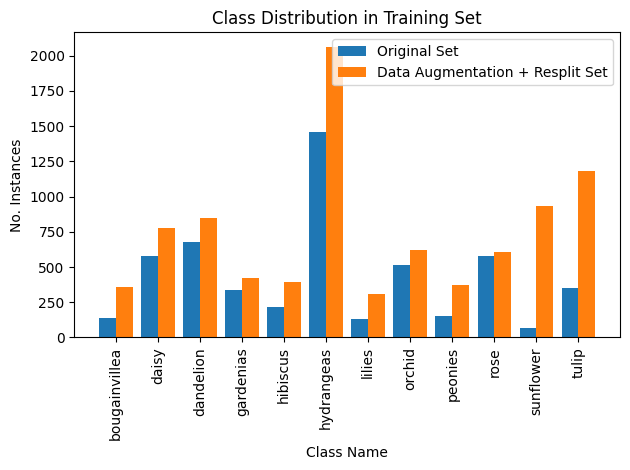

In [ ]:
# Load class names from data.yaml
with open(os.path.join(base_dir, "data.yaml")) as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

# Count class occurrences
all_labels_original = []
label_dir_original = os.path.join(base_dir, "train/labels")

for label_file in os.listdir(label_dir_original):
    with open(os.path.join(label_dir_original, label_file)) as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            all_labels_original.append(class_id)

counts_original = Counter(all_labels_original)

# Count class occurrences
all_labels_new = []
label_dir_new = os.path.join(base_dir, "augmented/resplit/train/labels")

for label_file in os.listdir(label_dir_new):
    with open(os.path.join(label_dir_new, label_file)) as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            all_labels_new.append(class_id)

counts_new = Counter(all_labels_new)

# Sort class IDs
sorted_ids = sorted(counts_original.keys())

# Get sorted class names and values
x_labels = [class_names[i] for i in sorted_ids]
y_values_original = [counts_original[i] for i in sorted_ids]
y_values_new = [counts_new[i] for i in sorted_ids]

# Plot
w, x = 0.4, np.arange(len(x_labels))
plt.bar(x - w/2, y_values_original, w, label='Original Set')
plt.bar(x + w/2, y_values_new, w, label='Data Augmentation + Resplit Set')
plt.title("Class Distribution in Training Set")
plt.xlabel("Class Name")
plt.ylabel("No. Instances")
plt.xticks(x, x_labels, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

Class Distribution (by Images) in Training Set [Original Set VS Data Augmentation + Resplit Set]

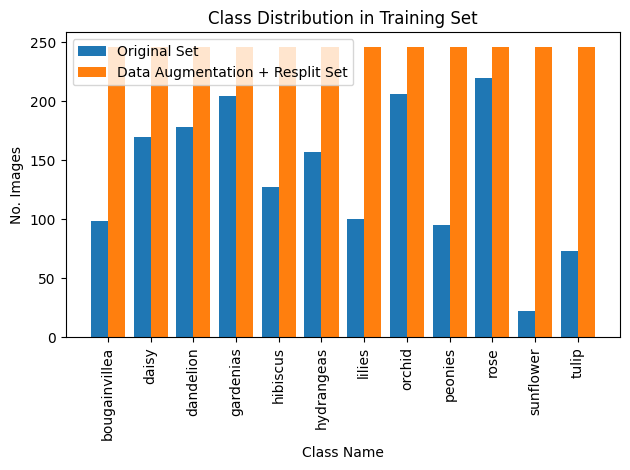

In [ ]:
# Load class names from data.yaml
with open(os.path.join(base_dir, "data.yaml")) as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

# Count class occurrences
all_labels_original = []
label_dir_original = os.path.join(base_dir, "train/labels")

for label_file in os.listdir(label_dir_original):
    with open(os.path.join(label_dir_original, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = int(lines[0].split()[0])
            all_labels_original.append(class_id)

counts_original = Counter(all_labels_original)

# Count class occurrences
all_labels_new = []
label_dir_new = os.path.join(base_dir, "augmented/resplit/train/labels")

for label_file in os.listdir(label_dir_new):
    with open(os.path.join(label_dir_new, label_file)) as f:
        lines = f.readlines()
        if lines:
            class_id = int(lines[0].split()[0])
            all_labels_new.append(class_id)

counts_new = Counter(all_labels_new)

# Sort class IDs
sorted_ids = sorted(counts_original.keys())

# Get sorted class names and values
x_labels = [class_names[i] for i in sorted_ids]
y_values_original = [counts_original[i] for i in sorted_ids]
y_values_new = [counts_new[i] for i in sorted_ids]

# Plot
w, x = 0.4, np.arange(len(x_labels))
plt.bar(x - w/2, y_values_original, w, label='Original Set')
plt.bar(x + w/2, y_values_new, w, label='Data Augmentation + Resplit Set')
plt.title("Class Distribution in Training Set")
plt.xlabel("Class Name")
plt.ylabel("No. Images")
plt.xticks(x, x_labels, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

Update data.yaml file with new paths

In [ ]:
path = "/content/plantIdentification-3/data.yaml"

# Load existing contents
with open(path, "r") as f:
    data = f.read()

# Replace relative paths with full paths
data = data.replace("test: ../", "test: /content/plantIdentification-3/augmented/resplit/")
data = data.replace("train: plantIdentification-3/", "train: /content/plantIdentification-3/augmented/resplit/")
data = data.replace("val: plantIdentification-3/", "val: /content/plantIdentification-3/augmented/resplit/")

# Overwrite the file
with open(path, "w") as f:
    f.write(data)

print("data.yaml updated successfully.")

data.yaml updated successfully.


# Model Training and Validation

File "/content/yolov5/train.py", line 215: ckpt = torch.load(weights, map_location="cpu", weights_only=False)

File "/content/yolov5/utils/general.py", line 1130: x = torch.load(f, map_location=torch.device("cpu"), weights_only=False)

In [ ]:
# Train on training set, evaluate on validation set
!python train.py --img 640 --batch 16 --epochs 20 --data /content/plantIdentification-3/data.yaml --weights yolov5s.pt

In [ ]:
# Predict on validation set
!python detect.py --weights runs/train/exp2/weights/best.pt --source /content/plantIdentification-3/augmented/resplit/valid/images --save-txt --save-conf --conf 0.4

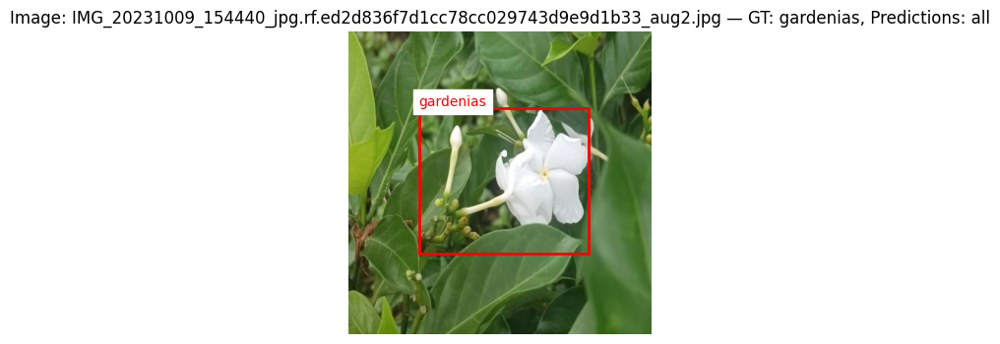

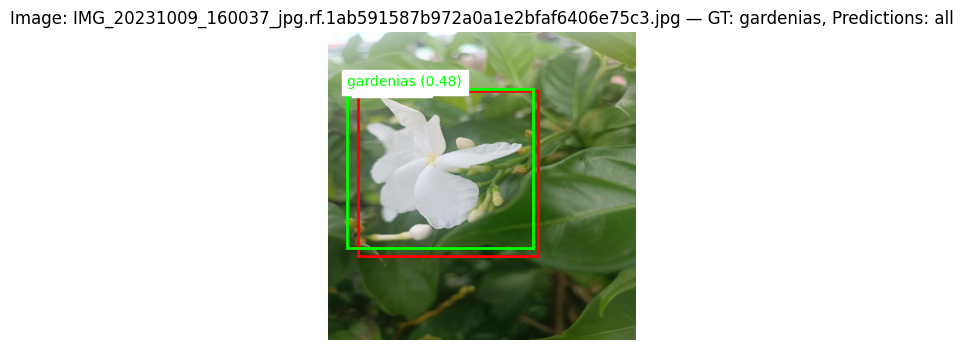

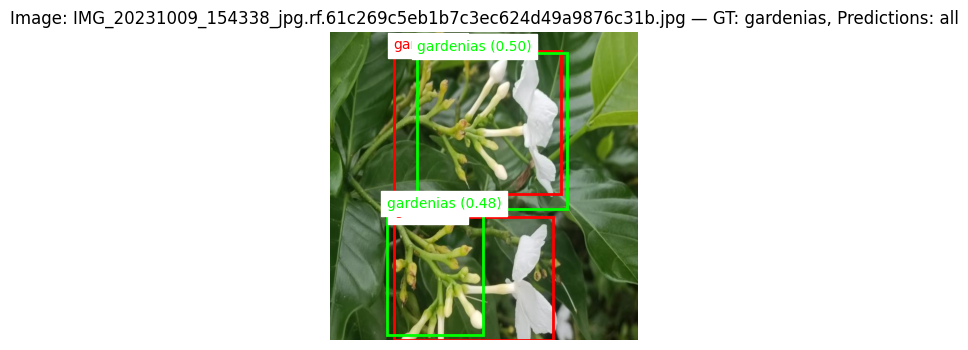

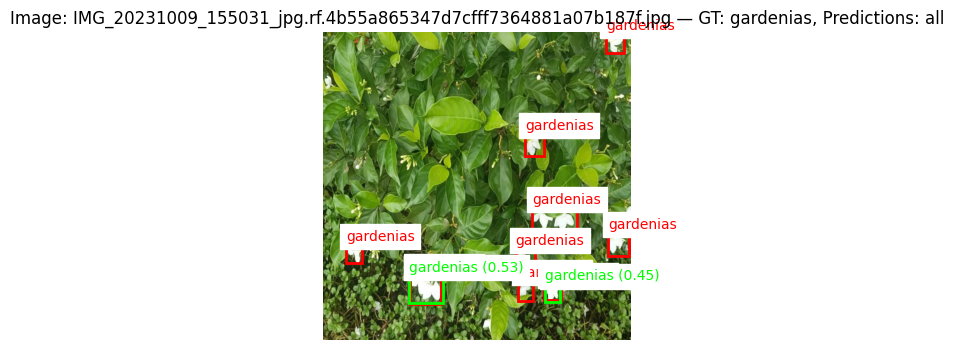

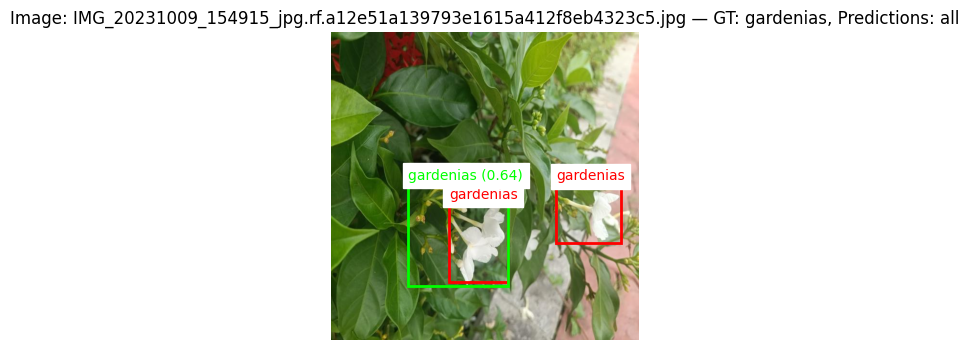

...

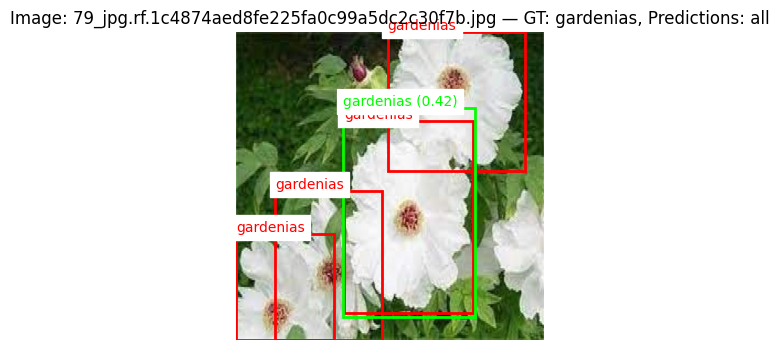

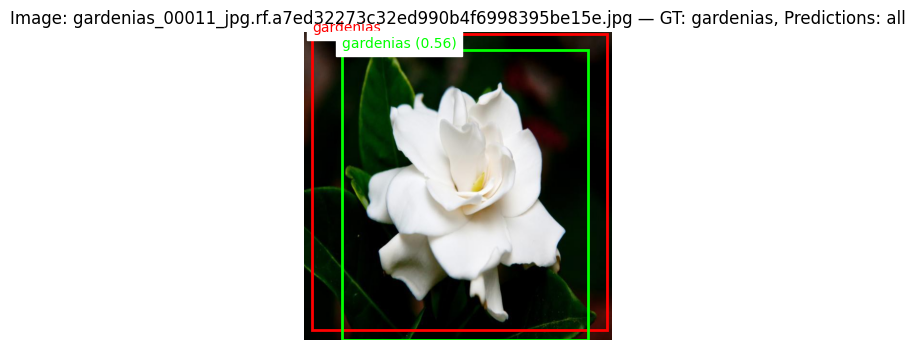

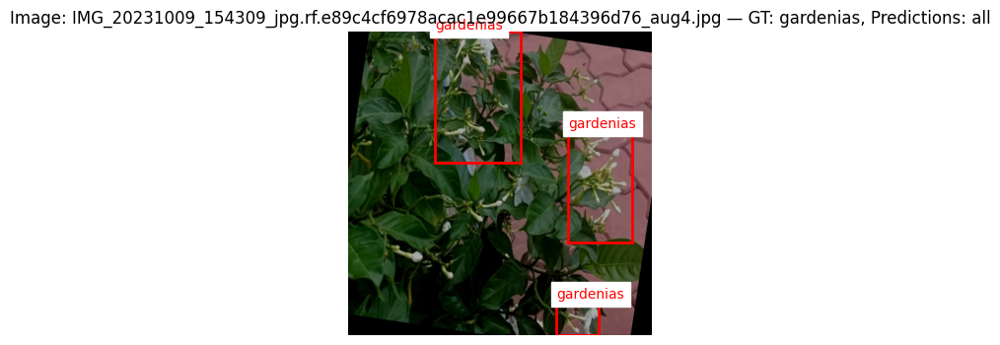

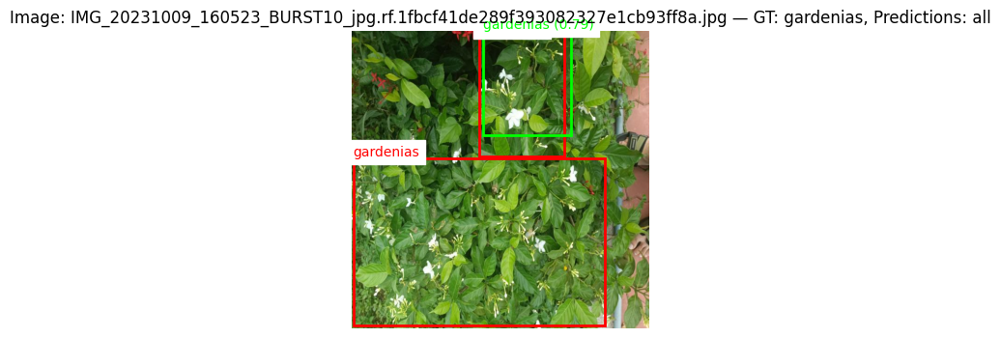

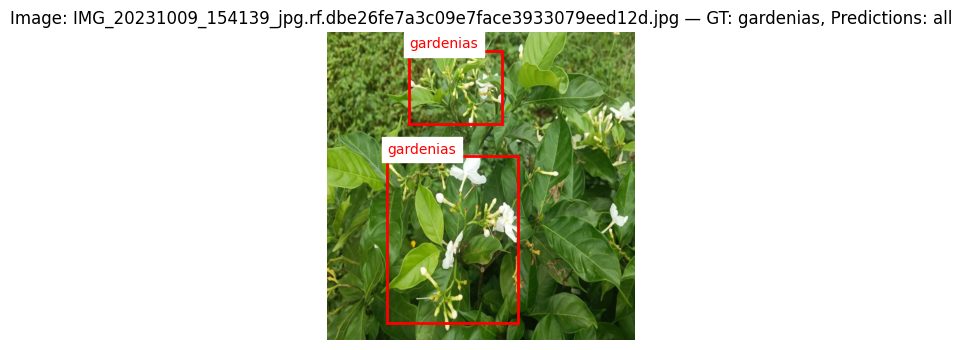

In [ ]:
# Visualise ground truth vs predictions for a specific class

# === CONFIG ===
target_class_name = "gardenias"  # Change target class
img_folder = "/content/plantIdentification-3/augmented/resplit/valid/images"
gt_folder = "/content/plantIdentification-3/augmented/resplit/valid/labels"
pred_folder = "/content/yolov5/runs/detect/exp2/labels"

# Load class names
with open("/content/plantIdentification-3/data.yaml") as f:
    class_names = yaml.safe_load(f)["names"]
target_class_id = class_names.index(target_class_name)

# === HELPER ===
def draw_boxes(ax, label_file, img_w, img_h, class_names, filter_class=None, is_pred=False, with_conf=False):
    if not os.path.exists(label_file):
        return
    with open(label_file) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue

            cls_id = int(parts[0])
            if filter_class is not None and not is_pred and cls_id != filter_class:
                continue  # Skip other ground truth classes

            x_center, y_center, w, h = map(float, parts[1:5])
            conf = float(parts[5]) if with_conf and len(parts) >= 6 else None

            # Convert from YOLO (normalized center format) to (xmin, ymin, w, h) in pixels
            box_w = w * img_w
            box_h = h * img_h
            xmin = (x_center - w / 2) * img_w
            ymin = (y_center - h / 2) * img_h

            color = "lime" if is_pred else "red"
            label_text = f"{class_names[cls_id]}"
            if is_pred and conf is not None:
                label_text += f" ({conf:.2f})"

            rect = patches.Rectangle((xmin, ymin), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, label_text, color=color, fontsize=10, backgroundcolor="white")

# === Main Loop ===
for img_name in os.listdir(img_folder):
    base = os.path.splitext(img_name)[0]
    img_path = os.path.join(img_folder, img_name)
    gt_path = os.path.join(gt_folder, base + ".txt")
    pred_path = os.path.join(pred_folder, base + ".txt")

    if not os.path.exists(gt_path):
        continue

    # Only proceed if this image contains GT of the target class
    has_target = False
    with open(gt_path) as f:
        for line in f:
            if int(line.strip().split()[0]) == target_class_id:
                has_target = True
                break
    if not has_target:
        continue

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Plot image with GT + all predictions
    fig, ax = plt.subplots(1, figsize=(4, 4))
    ax.imshow(img)
    ax.set_title(f"Image: {img_name} — GT: {target_class_name}, Predictions: all")

    # Ground truth only for target class
    draw_boxes(ax, gt_path, w, h, class_names, filter_class=target_class_id, is_pred=False)

    # All prediction boxes (with class names)
    draw_boxes(ax, pred_path, w, h, class_names, filter_class=None, is_pred=True, with_conf=True)

    plt.axis("off")
    plt.show()

# Model Testing

In [ ]:
# Evaluate on test set
!python val.py --img 640 --batch 16 --data /content/plantIdentification-3/data.yaml --weights runs/train/exp/weights/best.pt --task test

val: data=/content/plantIdentification-3/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
100% 755k/755k [00:00<00:00, 20.0MB/s]
test: Scanning /content/plantIdentification-3/augmented/resplit/test/labels... 384 images, 0 backgrounds, 0 corrupt: 100% 384/384 [00:00<00:00, 1813.39it/s]
test: New cache created: /content/plantIdentification-3/augmented/resplit/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 24/24 [00:10<00:00,  2.34it/s]
                   all  

In [ ]:
# Predict on test set
!python detect.py --weights runs/train/exp/weights/best.pt --source /content/plantIdentification-3/augmented/resplit/test/images --save-txt --save-conf --conf 0.4

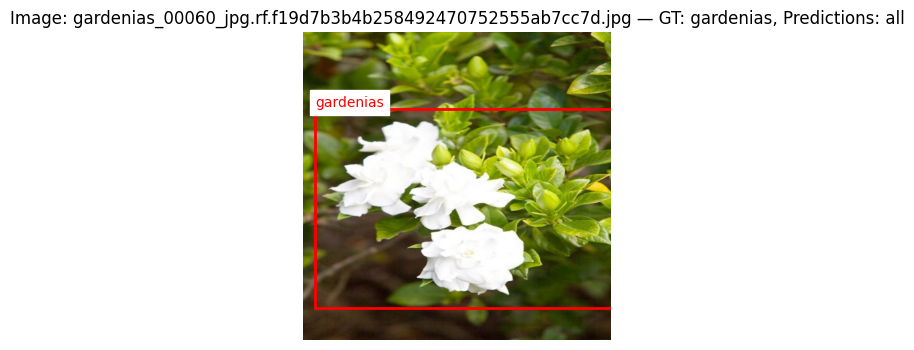

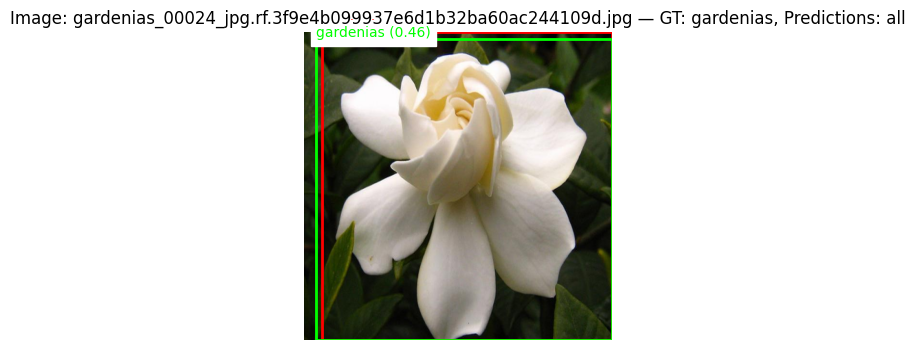

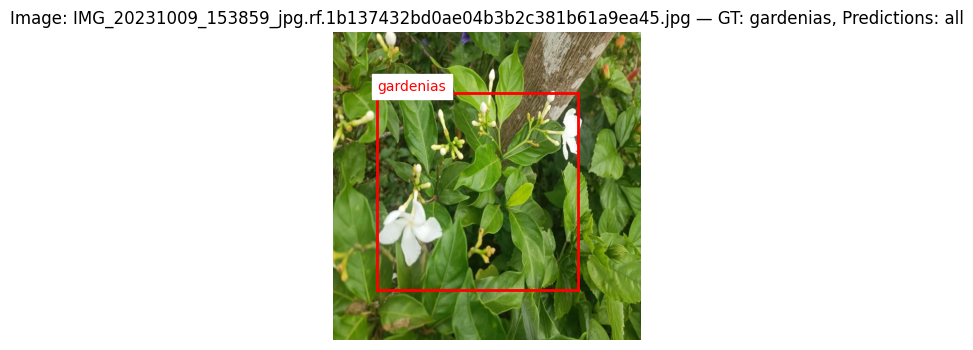

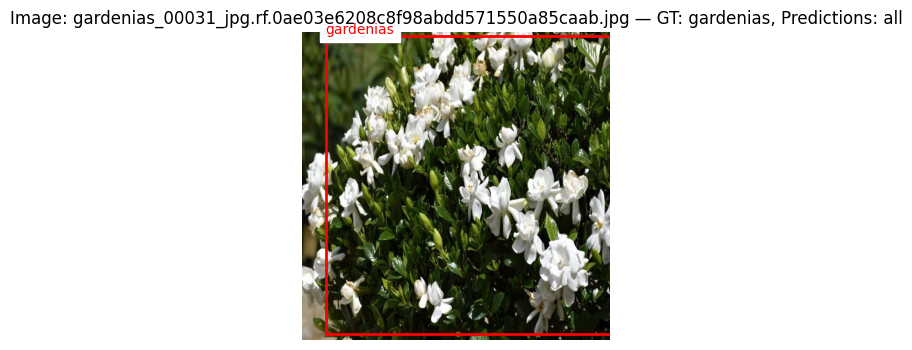

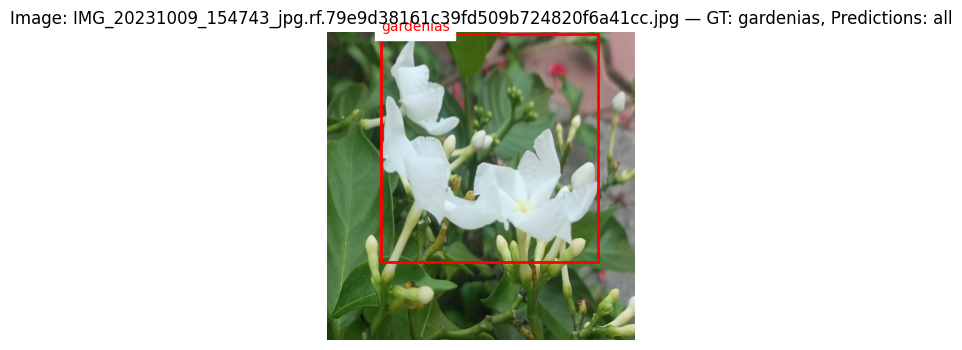

...

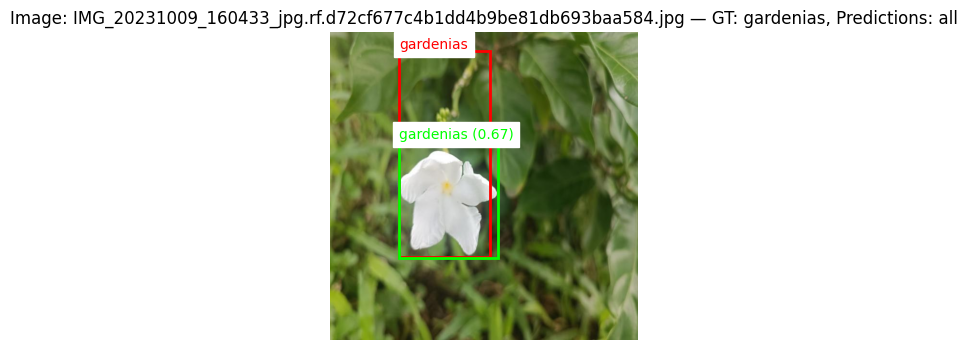

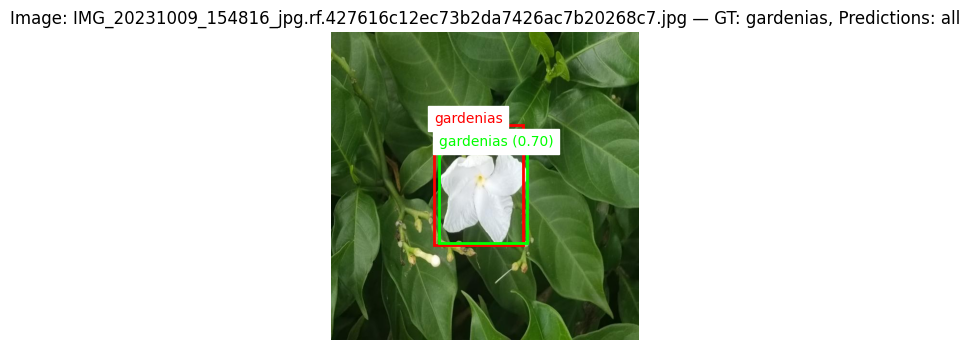

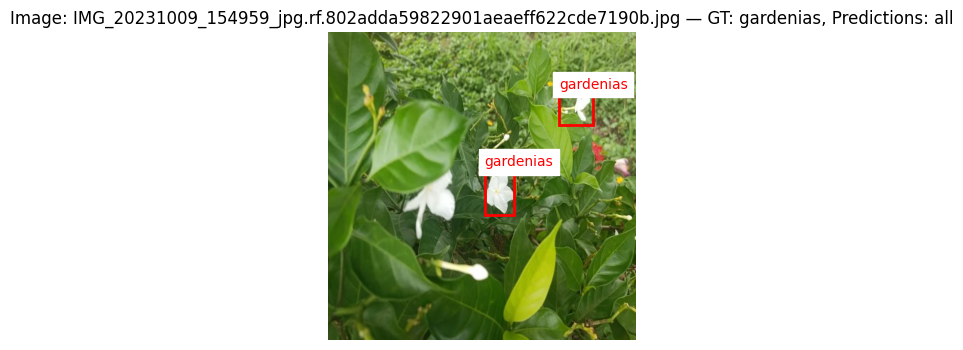

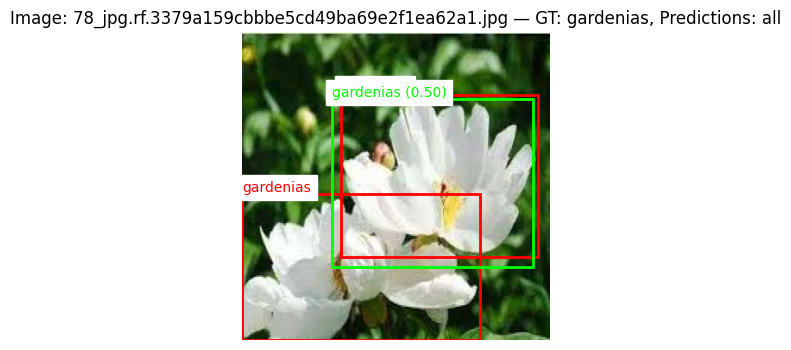

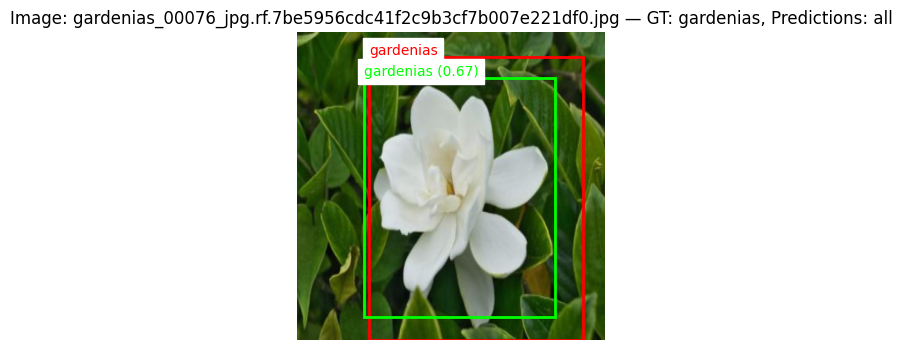

In [ ]:
# Visualise ground truth vs predictions for a specific class

# === CONFIG ===
target_class_name = "gardenias"  # Change target class
img_folder = "/content/plantIdentification-3/augmented/resplit/test/images"
gt_folder = "/content/plantIdentification-3/augmented/resplit/test/labels"
pred_folder = "/content/yolov5/runs/detect/exp/labels"

# Load class names
with open("/content/plantIdentification-3/data.yaml") as f:
    class_names = yaml.safe_load(f)["names"]
target_class_id = class_names.index(target_class_name)

# === HELPER ===
def draw_boxes(ax, label_file, img_w, img_h, class_names, filter_class=None, is_pred=False, with_conf=False):
    if not os.path.exists(label_file):
        return
    with open(label_file) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue

            cls_id = int(parts[0])
            if filter_class is not None and not is_pred and cls_id != filter_class:
                continue  # Skip other ground truth classes

            x_center, y_center, w, h = map(float, parts[1:5])
            conf = float(parts[5]) if with_conf and len(parts) >= 6 else None

            # Convert from YOLO (normalized center format) to (xmin, ymin, w, h) in pixels
            box_w = w * img_w
            box_h = h * img_h
            xmin = (x_center - w / 2) * img_w
            ymin = (y_center - h / 2) * img_h

            color = "lime" if is_pred else "red"
            label_text = f"{class_names[cls_id]}"
            if is_pred and conf is not None:
                label_text += f" ({conf:.2f})"

            rect = patches.Rectangle((xmin, ymin), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, label_text, color=color, fontsize=10, backgroundcolor="white")

# === Main Loop ===
for img_name in os.listdir(img_folder):
    base = os.path.splitext(img_name)[0]
    img_path = os.path.join(img_folder, img_name)
    gt_path = os.path.join(gt_folder, base + ".txt")
    pred_path = os.path.join(pred_folder, base + ".txt")

    if not os.path.exists(gt_path):
        continue

    # Only proceed if this image contains GT of the target class
    has_target = False
    with open(gt_path) as f:
        for line in f:
            if int(line.strip().split()[0]) == target_class_id:
                has_target = True
                break
    if not has_target:
        continue

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    # Plot image with GT + all predictions
    fig, ax = plt.subplots(1, figsize=(4, 4))
    ax.imshow(img)
    ax.set_title(f"Image: {img_name} — GT: {target_class_name}, Predictions: all")

    # Ground truth only for target class
    draw_boxes(ax, gt_path, w, h, class_names, filter_class=target_class_id, is_pred=False)

    # All prediction boxes (with class names)
    draw_boxes(ax, pred_path, w, h, class_names, filter_class=None, is_pred=True, with_conf=True)

    plt.axis("off")
    plt.show()